### IMPORT

In [1]:
# import the necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy import stats

In [2]:
# load the data set
df = pd.read_csv('train.csv')

In [9]:
df[df['tempo'] == 0]

,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,...,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,genre
267,Hair Dryer Sound 20 - Loopable With No Fade,84000,False,37,Deep Sleep Hair Dryers;Hair Dryer Collection;Hair Dryer Sounds,Hair Dryers,0.0,0.000030,3,-22.367,...,0.443,0.0,0.0,84000,0.0,0.0,0.0,NaN,1.738916,sleep
664,Brown Noise with Binaural Beats - Theta - Loopable with No Fade,73886,False,34,Sleep Baby Sleep;White Noise Meditation;Delta Don and Theta Mind Cream;Soothing White Noise for Relaxation;Binaural Beats,"Brown Noise, White Noise, and Binaural Beats Entrainment (Loopable with no Fade)",0.0,0.475000,9,-21.019,...,0.315,0.0,0.0,73887,0.0,0.0,0.0,NaN,1.343558,sleep
727,Outside Air Unit 2,64102,False,36,Sleep Baby Sleep;Relax & Relax;Relax Meditate Sleep;Deep Sleep Lullabies;Deep Meditation Lullabies,"Fans, Air Units, and Other Office Ambiences (Loopable Audio for Ambiance, Meditation, Insomnia, and Restless Children)",0.0,0.000262,10,-16.680,...,0.581,0.0,0.0,64102,0.0,0.0,0.0,NaN,0.757389,sleep
865,Weißes Rauschen: Rem-Schlaf,92879,False,40,Weißes Rauschen HD,"Weißes Geräusch Für Tiefen Schlaf, Tinnitus Und Meditation",0.0,0.000164,10,-23.108,...,0.143,0.0,0.0,92880,0.0,0.0,0.0,NaN,0.757389,sleep
944,Continuous Rain,162495,False,36,"Rain Sounds;Sounds Of Nature : Thunderstorm, Rain;The Rain Library","20 Sleeping Rain Sounds - Cure Insomnia, Sleep 8 Hours & Wake Refreshed",0.0,0.998000,11,-25.885,...,0.891,0.0,0.0,162496,0.0,0.0,0.0,NaN,0.748116,sleep
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13292,Pink Noise Relaxation,300001,False,38,Pink Noise,The Best Pink Noise,0.0,0.000060,10,-12.822,...,0.237,0.0,0.0,300002,0.0,0.0,0.0,0.314,0.757389,sleep
13566,Clean White Noise - Loopable With No Fade - White Noise For Baby Sleep Remix,67682,False,31,White Noise Babies;White Noise For Baby Sleep,Loopable White Noise,0.0,0.000020,10,-43.046,...,0.101,0.0,0.0,67682,0.0,0.0,0.0,NaN,0.757389,sleep
13595,Pink Noise For Sleep 2,100934,False,40,Granular,Pink Noise For Sleep,0.0,0.167000,1,-28.114,...,0.112,0.0,0.0,100935,0.0,0.0,0.0,NaN,2.367412,sleep
14142,Clean White Noise - Loopable Without Fade,67682,False,39,White Noise Babies,Loopable White Noise For Baby Sleep,0.0,0.000020,10,-43.046,...,0.101,0.0,0.0,67682,0.0,0.0,0.0,NaN,0.757389,sleep


In [14]:
df[df['genre'] == 'black-metal'].describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing
count,7.500000e+02,750.000000,750.000000,750.000000,750.000000,750.000000,521.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,7.500000e+02,645.000000,750.00000,750.000000,94.000000,750.000000
mean,3.126808e+05,22.160000,0.298734,0.875368,5.504000,-6.508709,0.571977,0.087969,0.027036,0.438376,0.243304,0.194478,128.388135,3.126767e+05,3.818605,656.55200,171.869333,0.479532,2.167187
std,1.592504e+05,12.613532,0.131337,0.157050,3.477083,2.779476,0.495268,0.052698,0.127217,0.368188,0.177081,0.152535,29.720199,1.592521e+05,0.559748,368.66275,106.685651,0.293237,1.222210
min,6.141200e+04,0.000000,0.065800,0.088700,0.000000,-23.952000,0.000000,0.023800,0.000000,0.000000,0.031600,0.017700,51.436000,6.141300e+04,1.000000,94.00000,22.000000,0.016000,0.748116
25%,2.194662e+05,17.000000,0.193000,0.846000,2.000000,-7.600500,0.000000,0.052100,0.000007,0.024900,0.106250,0.072550,106.169250,2.194665e+05,4.000000,440.00000,112.000000,0.235750,1.170953
50%,2.826000e+05,19.000000,0.280500,0.936000,6.000000,-6.048500,1.000000,0.075550,0.000050,0.416500,0.198000,0.154000,128.234000,2.826000e+05,4.000000,597.00000,152.000000,0.448500,1.738916
75%,3.646660e+05,23.000000,0.401750,0.972000,9.000000,-4.845000,1.000000,0.105000,0.000799,0.815000,0.333750,0.272750,148.759250,3.646660e+05,4.000000,780.75000,205.000000,0.736750,3.349057
max,1.478618e+06,75.000000,0.639000,1.000000,11.000000,-1.456000,1.000000,0.453000,0.985000,0.988000,0.988000,0.800000,200.779000,1.478619e+06,5.000000,3864.00000,1293.000000,0.995000,4.067086


In [12]:
df[df['genre'] == ''].describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing
count,7.500000e+02,750.000000,750.000000,750.000000,750.000000,750.000000,522.000000,750.000000,750.000000,750.000000,750.000000,750.000000,750.000000,7.500000e+02,649.000000,750.000000,750.000000,98.000000,750.000000
mean,1.846292e+05,35.045333,0.210707,0.361179,4.858667,-23.081637,0.706897,0.059597,0.651964,0.683760,0.344084,0.085474,88.501516,1.846305e+05,3.127889,270.388000,73.929333,0.446929,2.211267
std,2.286592e+05,20.086278,0.180409,0.370844,3.663958,8.868229,0.455622,0.053713,0.370126,0.365665,0.310243,0.143945,43.054241,2.286589e+05,1.514531,321.380106,102.356684,0.287203,1.172448
min,2.400000e+04,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.400000e+04,0.000000,0.000000,0.000000,0.018000,0.748116
25%,1.165725e+05,29.000000,0.106000,0.025325,1.000000,-30.258500,0.000000,0.040525,0.263750,0.462750,0.109000,0.000693,70.334000,1.165728e+05,3.000000,145.000000,39.000000,0.207250,1.170953
50%,1.610695e+05,37.000000,0.165500,0.219000,5.000000,-22.388000,1.000000,0.048450,0.860500,0.870500,0.162500,0.033450,84.345000,1.610700e+05,4.000000,233.500000,62.000000,0.399000,2.367412
75%,2.032500e+05,50.000000,0.243750,0.654500,8.000000,-16.860500,1.000000,0.063875,0.964000,0.961000,0.547750,0.080500,119.998250,2.032500e+05,4.000000,333.000000,90.000000,0.708500,3.349057
max,4.120258e+06,94.000000,0.956000,1.000000,11.000000,-4.742000,1.000000,0.528000,0.996000,1.000000,0.994000,0.945000,214.864000,4.120258e+06,5.000000,6484.000000,2170.000000,0.994000,4.067086


### UNDERSTANDING

In [5]:
# show the dataset
df.head()

,name,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,...,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,genre,duration_min
0,Long Road,0,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,1.0,...,0.6350,142.221,241760,4.0,567.0,141.0,NaN,1.279305,j-dance,4.029333
1,"Daniâl My Son, Where Did You Vanish?",0,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0,...,0.0336,75.596,444000,4.0,617.0,155.0,NaN,2.367412,iranian,7.400000
2,Ondskapens Galakse,0,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,...,0.4890,116.628,333507,4.0,652.0,162.0,NaN,3.700483,black-metal,5.558433
3,Can't Look Away,0,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,1.0,...,0.3850,140.880,269800,4.0,619.0,155.0,0.469,1.279305,bluegrass,4.496667
4,Thunderground,0,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,1.0,...,0.6370,143.956,307652,4.0,733.0,183.0,NaN,4.067086,happy,5.127517


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   name                   15000 non-null  object 
 1   duration_ms            15000 non-null  int64  
 2   explicit               15000 non-null  bool   
 3   popularity             15000 non-null  int64  
 4   artists                15000 non-null  object 
 5   album_name             15000 non-null  object 
 6   danceability           15000 non-null  float64
 7   energy                 15000 non-null  float64
 8   key                    15000 non-null  int64  
 9   loudness               15000 non-null  float64
 10  mode                   10550 non-null  float64
 11  speechiness            15000 non-null  float64
 12  acousticness           15000 non-null  float64
 13  instrumentalness       15000 non-null  float64
 14  liveness               15000 non-null  float64
 15  va

In [5]:
df.describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing
count,1.500000e+04,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,10550.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,1.500000e+04,12938.000000,15000.000000,15000.00000,2217.000000,15000.000000
mean,2.468075e+05,27.423667,0.551063,0.656231,5.287867,-8.894999,0.631374,0.083779,0.303896,0.286734,0.216790,0.436853,123.116544,2.467947e+05,3.876179,501.862333,128.39340,0.490479,2.199647
std,1.279941e+05,18.587534,0.194239,0.264371,3.585023,6.005799,0.482455,0.086709,0.329536,0.382930,0.195295,0.277220,31.930958,1.279850e+05,0.566491,280.689804,75.11391,0.291330,1.212616
min,8.586000e+03,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.587000e+03,0.000000,0.000000,0.00000,0.000000,0.748116
25%,1.800000e+05,14.000000,0.441000,0.480000,2.000000,-10.636250,0.000000,0.037300,0.009745,0.000000,0.097900,0.196000,99.939000,1.800000e+05,4.000000,327.000000,83.00000,0.230000,1.170953
50%,2.278260e+05,24.000000,0.580000,0.709000,5.000000,-7.303000,1.000000,0.051000,0.155000,0.003130,0.131000,0.416000,124.188000,2.278185e+05,4.000000,461.000000,117.00000,0.480000,1.738916
75%,2.889030e+05,42.000000,0.695000,0.884000,8.000000,-5.101000,1.000000,0.088600,0.573000,0.744000,0.280000,0.664000,141.986500,2.889030e+05,4.000000,625.000000,159.00000,0.739000,3.349057
max,4.120258e+06,94.000000,0.980000,1.000000,11.000000,3.156000,1.000000,0.939000,0.996000,1.000000,0.994000,0.995000,220.525000,4.120258e+06,5.000000,7348.000000,2170.00000,1.000000,4.067086


In [6]:
df.nunique()

name                     15000
duration_ms              12991
explicit                     2
popularity                  88
artists                   6257
album_name                9820
danceability              1014
energy                    1379
key                         12
loudness                  9551
mode                         2
speechiness               1199
acousticness              3685
instrumentalness          3593
liveness                  1554
valence                   1617
tempo                    11859
features_duration_ms     12981
time_signature               5
n_beats                   1281
n_bars                     451
popularity_confidence      885
processing                  12
genre                       20
dtype: int64

In [3]:
# convert boolean type to integer type
df['explicit'] = df['explicit'].astype(int)

# convert time from milliseconds to minutes and update column name
df['duration_min'] = df['duration_ms'] / (1000 * 60)
df.drop(columns=['duration_ms'], inplace=True)

In [8]:
# show the dataset with updated values
df.head()

,name,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,...,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,genre,duration_min
0,Long Road,0,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,1.0,...,0.6350,142.221,241760,4.0,567.0,141.0,NaN,1.279305,j-dance,4.029333
1,"Daniâl My Son, Where Did You Vanish?",0,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0,...,0.0336,75.596,444000,4.0,617.0,155.0,NaN,2.367412,iranian,7.400000
2,Ondskapens Galakse,0,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,...,0.4890,116.628,333507,4.0,652.0,162.0,NaN,3.700483,black-metal,5.558433
3,Can't Look Away,0,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,1.0,...,0.3850,140.880,269800,4.0,619.0,155.0,0.469,1.279305,bluegrass,4.496667
4,Thunderground,0,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,1.0,...,0.6370,143.956,307652,4.0,733.0,183.0,NaN,4.067086,happy,5.127517


### NUMRICAL VARIABLES

In [4]:
# select only numeric columns from the DataFrame
numeric_cols = df.columns[df.nunique() > 20]

numeric_data = df[numeric_cols].select_dtypes(include=['number'])
numeric_data

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,features_duration_ms,n_beats,n_bars,popularity_confidence,duration_min
0,46,0.690,0.513,-12.529,0.0975,0.302000,0.536000,0.2810,0.6350,142.221,241760,567.0,141.0,NaN,4.029333
1,0,0.069,0.196,-24.801,0.0805,0.283000,0.934000,0.3600,0.0336,75.596,444000,617.0,155.0,NaN,7.400000
2,3,0.363,0.854,-7.445,0.0397,0.000089,0.800000,0.2620,0.4890,116.628,333507,652.0,162.0,NaN,5.558433
3,23,0.523,0.585,-5.607,0.0765,0.066400,0.001270,0.1170,0.3850,140.880,269800,619.0,155.0,0.469,4.496667
4,25,0.643,0.687,-11.340,0.0539,0.000576,0.096900,0.2990,0.6370,143.956,307652,733.0,183.0,NaN,5.127517
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,0,0.554,0.657,-14.232,0.0558,0.016000,0.615000,0.1320,0.0335,117.319,432027,837.0,212.0,NaN,7.200433
14996,44,0.103,0.860,-19.627,0.0595,0.548000,0.940000,0.1230,0.0016,92.323,182747,277.0,92.0,NaN,3.045767
14997,43,0.799,0.535,-9.103,0.0594,0.001830,0.857000,0.0713,0.0708,126.000,400091,837.0,209.0,NaN,6.668183
14998,37,0.511,0.970,-2.299,0.0531,0.000337,0.000014,0.4020,0.2700,160.044,197250,513.0,130.0,NaN,3.287500


In [10]:
num_columns = len(numeric_data.columns)
num_columns

15

#### visualizations

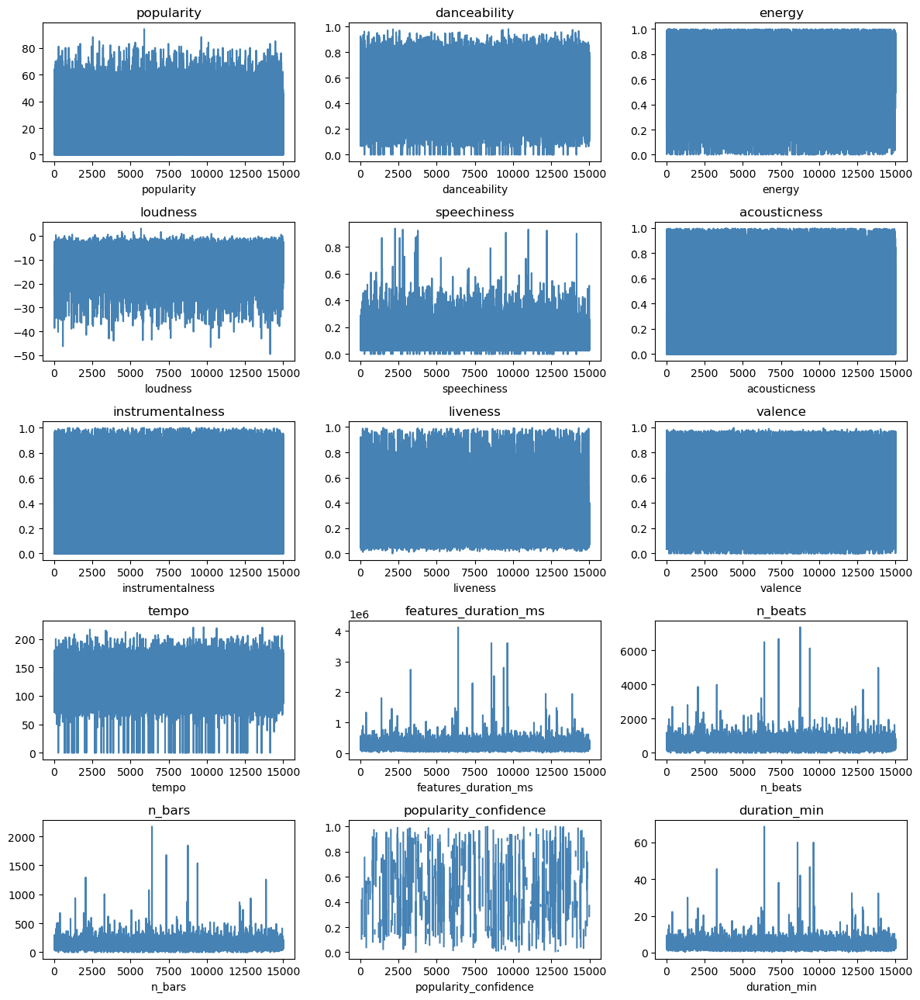

In [17]:
# make a plot for every numeric columns to visualize the data and see possible correlations
rows = 5
cols = 3

fig, axs = plt.subplots(rows, cols, figsize=(12, 13))

for i, column in enumerate(numeric_data.columns):
    ax = axs[i // cols, i % cols]
    ax.plot(numeric_data[column], color = 'steelblue') 
    ax.set_xlabel(column)
    ax.set_title(column) 
    ax.tick_params(axis='x')

plt.tight_layout() 
plt.show()

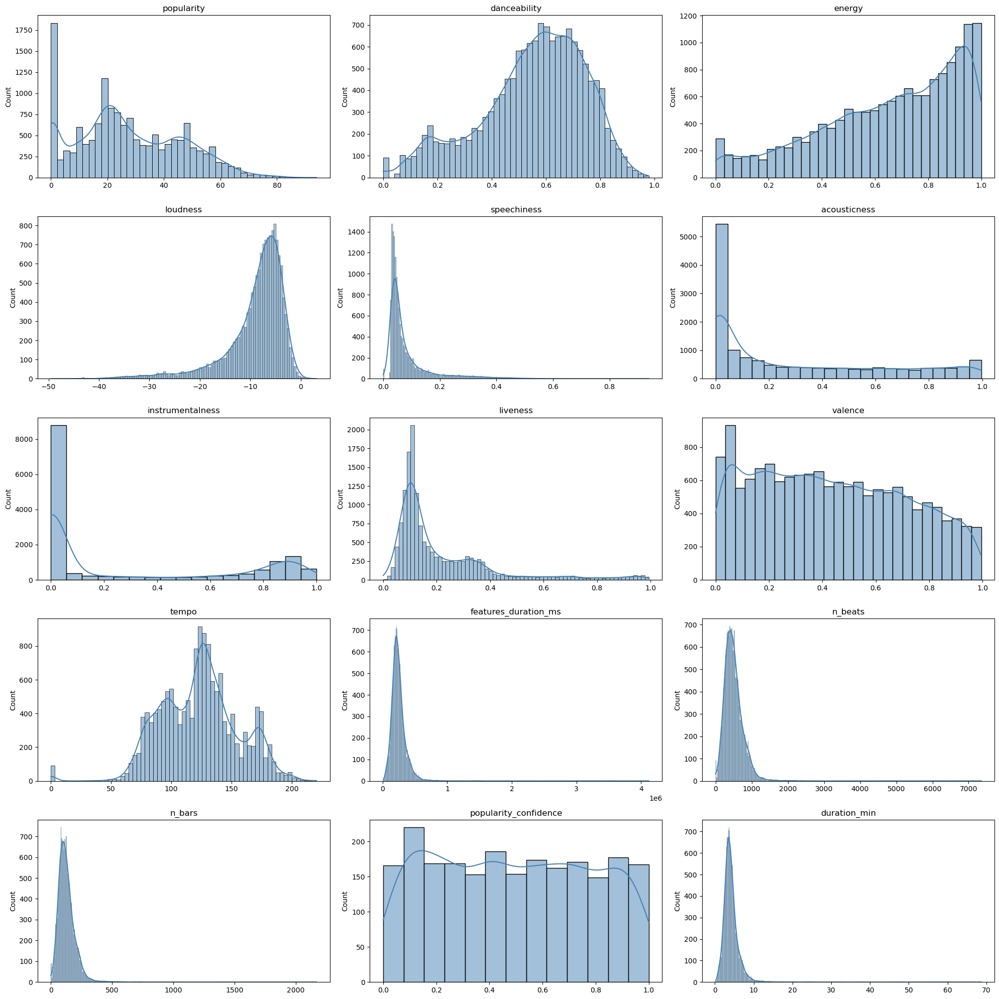

In [18]:
# making histogram plots for numerical variables
rows = 5 
cols = 3 

fig, axs = plt.subplots(rows, cols, figsize=(20, 20)) 

for i, col in enumerate(numeric_data.columns):
    ax = axs[i // cols, i % cols]
    sns.histplot(numeric_data[col], ax=ax, kde=True, color = 'steelblue')
    ax.set_title(col)
    ax.set_xlabel('')

plt.tight_layout()
plt.show()

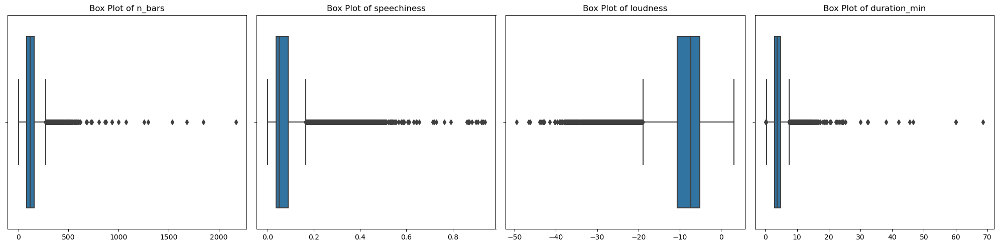

In [45]:
numerical_columns = ['n_bars', 'speechiness', 'loudness', 'duration_min']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, column in enumerate(numerical_columns):
    sns.boxplot(x=df[column], ax=axes[i])
    axes[i].set_title(f'Box Plot of {column}')
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

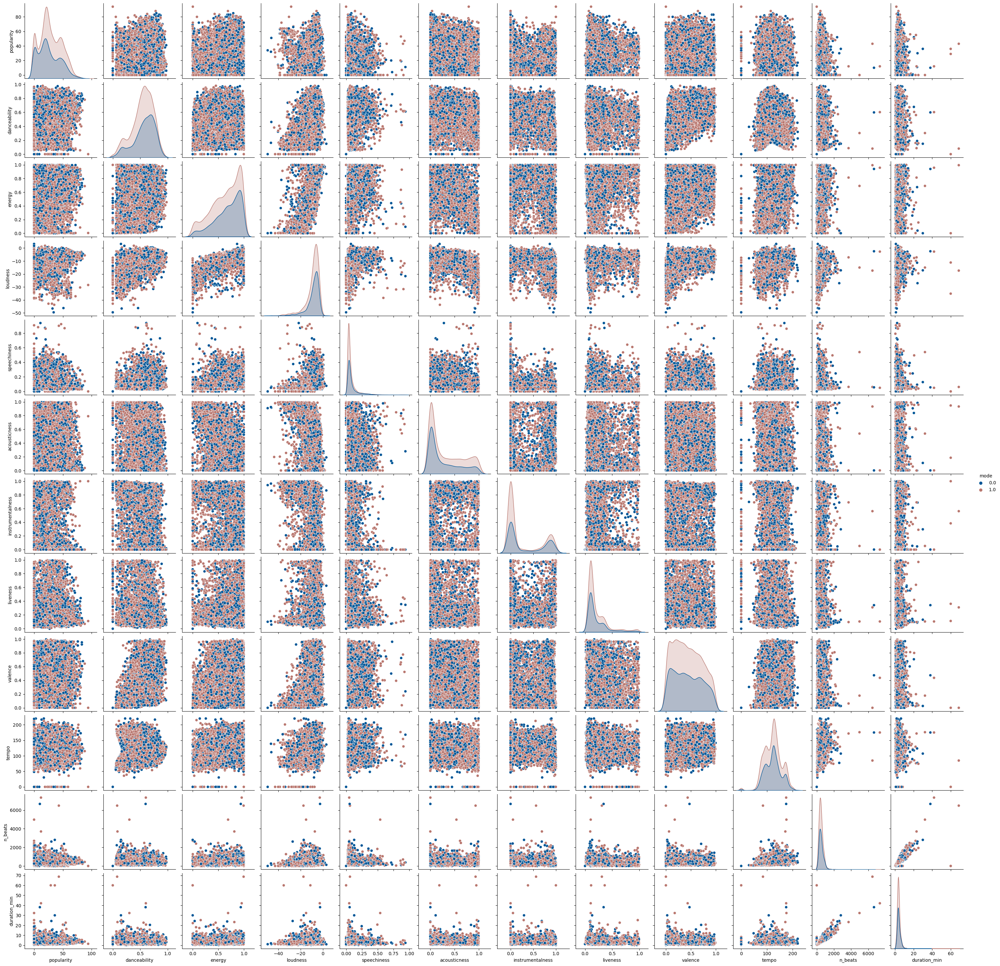

In [21]:
# plot a scatter to see the relationship between the data
sns.pairplot(df[['popularity', 'danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 
       'n_beats','duration_min', 'mode']], 
       kind='scatter', hue = 'mode', palette = ['#015697',  "#b9776f"])
plt.show()

#### correlation heatmap

In [8]:
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import numpy as np

cmap = clr.LinearSegmentedColormap.from_list('custom_map', ['#015697','white',  (0.60784314, 0.19215686, 0.16078431)], N=256)

In [7]:
# calculate correlation pearson
correlation = df.corr()
correlation

,explicit,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,duration_min
explicit,1.000000,-0.013096,0.056992,0.124405,-0.000991,0.131777,-0.042846,0.294287,-0.113975,-0.125101,0.006995,0.008631,0.016972,-0.048699,0.051260,-0.039830,-0.039435,0.029119,-0.005878,-0.048723
popularity,-0.013096,1.000000,0.051046,-0.056547,-0.008992,0.046703,0.073043,-0.096382,0.078424,-0.266843,0.027105,0.077652,-0.024162,-0.076228,-0.003160,-0.084774,-0.089134,-0.003665,0.008733,-0.076202
danceability,0.056992,0.051046,1.000000,0.193940,0.035311,0.385244,-0.072422,0.111454,-0.199082,-0.202316,-0.174193,0.559578,0.092267,-0.080891,0.292167,-0.033604,-0.069332,0.011602,-0.026273,-0.080932
energy,0.124405,-0.056547,0.193940,1.000000,0.057815,0.720907,-0.079969,0.143454,-0.699454,-0.203111,0.191024,0.284069,0.331538,0.102985,0.204646,0.243586,0.208615,0.040022,-0.037847,0.102996
key,-0.000991,-0.008992,0.035311,0.057815,1.000000,0.047718,-0.157515,0.018157,-0.049867,-0.001532,-0.007420,0.028221,0.022414,0.016786,0.028388,0.027133,0.022042,0.019790,-0.490366,0.016712
loudness,0.131777,0.046703,0.385244,0.720907,0.047718,1.000000,-0.033544,0.109793,-0.552519,-0.447106,0.047502,0.377743,0.308203,0.039415,0.250568,0.165565,0.131064,0.049174,-0.020563,0.039403
mode,-0.042846,0.073043,-0.072422,-0.079969,-0.157515,-0.033544,1.000000,-0.064289,0.085246,-0.080035,0.015738,-0.006907,-0.013001,-0.023409,-0.019378,-0.030685,-0.027687,0.003698,0.261129,-0.023310
speechiness,0.294287,-0.096382,0.111454,0.143454,0.018157,0.109793,-0.064289,1.000000,-0.087997,-0.115803,0.050034,0.056068,0.062161,-0.074722,0.080739,-0.043217,-0.040820,0.026399,-0.022909,-0.074774
acousticness,-0.113975,0.078424,-0.199082,-0.699454,-0.049867,-0.552519,0.085246,-0.087997,1.000000,0.094256,-0.075924,-0.131961,-0.244244,-0.184846,-0.139706,-0.283324,-0.248164,-0.021155,0.022684,-0.184902
instrumentalness,-0.125101,-0.266843,-0.202316,-0.203111,-0.001532,-0.447106,-0.080035,-0.115803,0.094256,1.000000,-0.088589,-0.348955,-0.117466,0.079757,-0.123982,0.034830,0.044498,-0.025716,-0.012960,0.079685


In [13]:
correlation.columns

Index(['explicit', 'popularity', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'features_duration_ms', 'time_signature', 'n_beats',
       'n_bars', 'popularity_confidence', 'processing', 'duration_min'],
      dtype='object')

In [14]:
mask=np.tri(len(correlation.columns))
np.fill_diagonal(mask, 0)

In [15]:
mask=mask.T

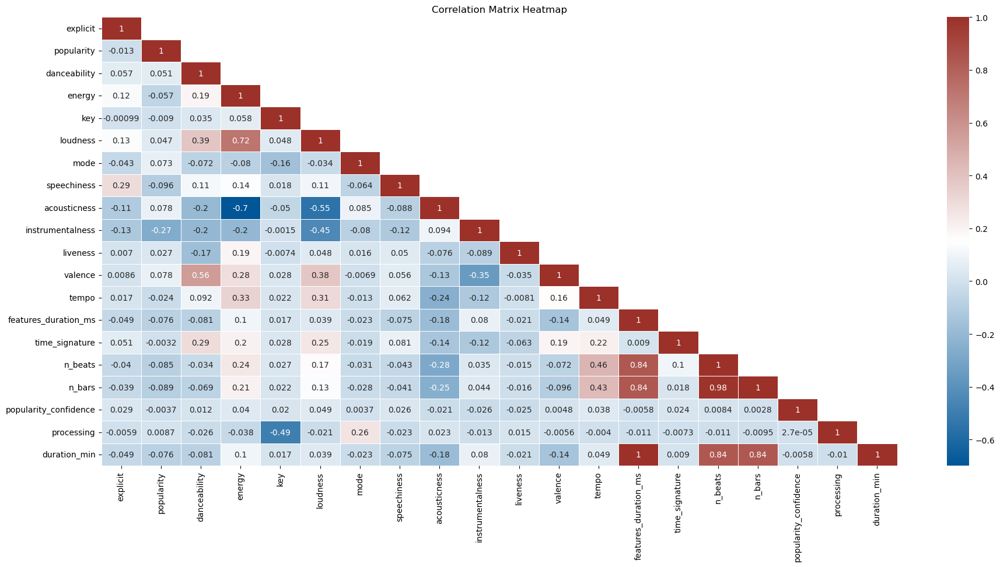

In [19]:
# make heatmap
plt.figure(figsize=(22, 10))  
sns.heatmap(correlation, annot=True, cmap=cmap, linewidths=.5, mask = mask)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [26]:
# grouping the DataFrame by 'genre' and calculating correlation pearson within each group
genre_correlations = numeric_data.groupby(df['genre']).apply(lambda group: group.corr())
genre_correlations

popularity  danceability    energy  loudness  \
genre                                                                          
afrobeat popularity               1.000000     -0.252553 -0.120567  0.025528   
         danceability            -0.252553      1.000000  0.274564  0.246855   
         energy                  -0.120567      0.274564  1.000000  0.674253   
         loudness                 0.025528      0.246855  0.674253  1.000000   
         speechiness             -0.040498      0.087081  0.050559 -0.130448   
...                                    ...           ...       ...       ...   
techno   features_duration_ms     0.041894      0.295554 -0.184200 -0.314086   
         n_beats                  0.041941      0.245000 -0.091578 -0.252794   
         n_bars                   0.027794      0.227554 -0.100999 -0.259829   
         popularity_confidence   -0.001902      0.050383  0.129438  0.100377   
         duration_min             0.041888      0.295588 -0.184232 -0.314023   

                                speechiness  acousticness  instrumentalness  \
genre                                                                         
afrobeat popularity               -0.040498      0.002867         -0.175265   
         danceability              0.087081     -0.099771          0.004766   
         energy                    0.050559     -0.517366          0.014469   
         loudness                 -0.130448     -0.404650         -0.210133   
         speechiness               1.000000      0.058631         -0.149192   
...                                     ...           ...               ...   
techno   features_duration_ms     -0.222226     -0.196305          0.491157   
         n_beats                  -0.181745     -0.244919          0.486083   
         n_bars                   -0.177401     -0.228508          0.480636   
         popularity_confidence    -0.011845     -0.033204         -0.026664   
         duration_min             -0.222202     -0.196274          0.491166   

                                liveness   valence     tempo  \
genre                                                          
afrobeat popularity             0.124017 -0.336996  0.066498   
         danceability          -0.160212  0.594537 -0.068261   
         energy                 0.118860  0.458938  0.107304   
         loudness               0.046854  0.233256  0.133596   
         speechiness            0.149209  0.046253  0.027424   
...                                  ...       ...       ...   
techno   features_duration_ms  -0.320177 -0.335653 -0.114072   
         n_beats               -0.281724 -0.317036  0.164361   
         n_bars                -0.282593 -0.322347  0.157981   
         popularity_confidence -0.228443 -0.050460  0.052780   
         duration_min          -0.320221 -0.335609 -0.114154   

                                features_duration_ms   n_beats    n_bars  \
genre                                                                      
afrobeat popularity                         0.031063  0.066935  0.066373   
         danceability                      -0.129562 -0.143083 -0.172029   
         energy                            -0.033413  0.018118 -0.012616   
         loudness                          -0.069502 -0.002918 -0.023880   
         speechiness                       -0.147571 -0.113046 -0.112855   
...                                              ...       ...       ...   
techno   features_duration_ms               1.000000  0.952167  0.937703   
         n_beats                            0.952167  1.000000  0.983980   
         n_bars                             0.937703  0.983980  1.000000   
         popularity_confidence             -0.010849  0.004471  0.000067   
         duration_min                       0.999999  0.952143  0.937682   

                                popularity_confidence  duration_min  
genre                                                                
a

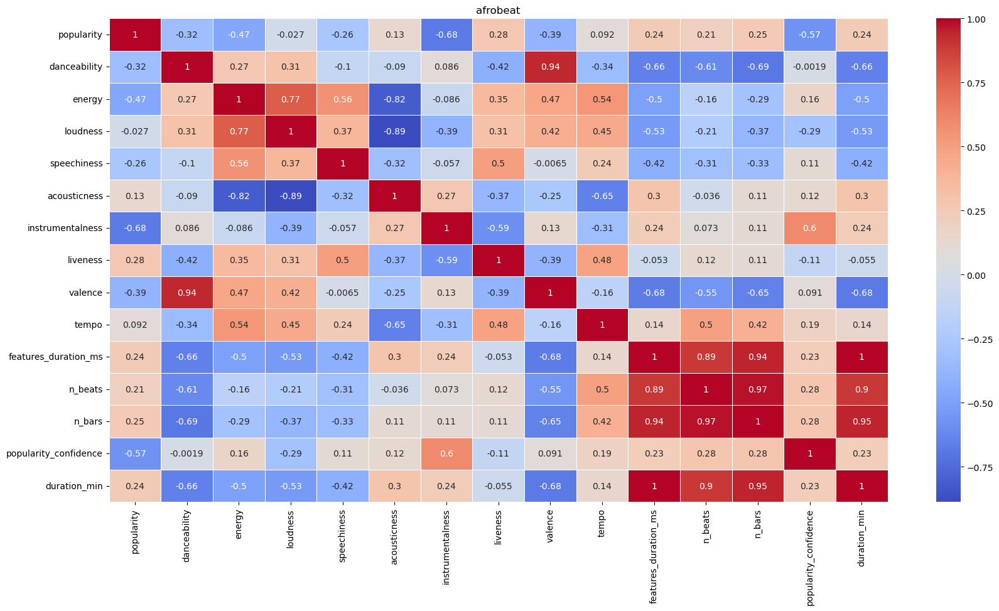

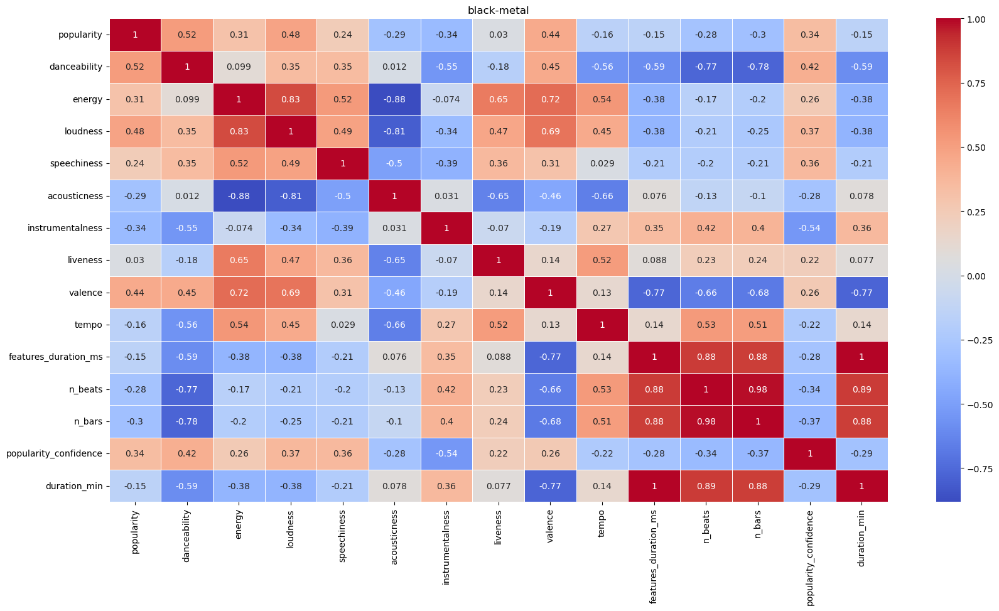

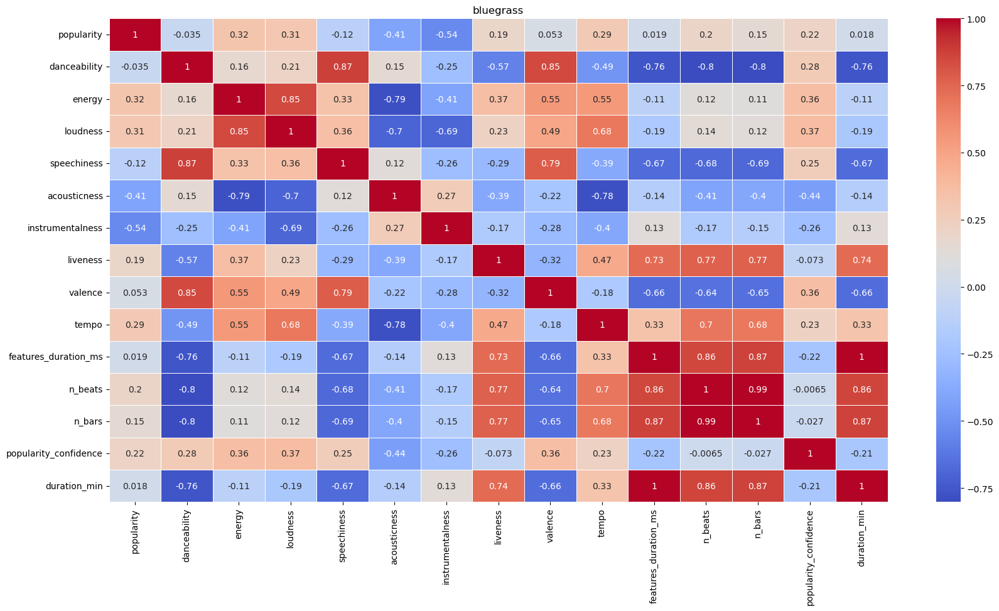

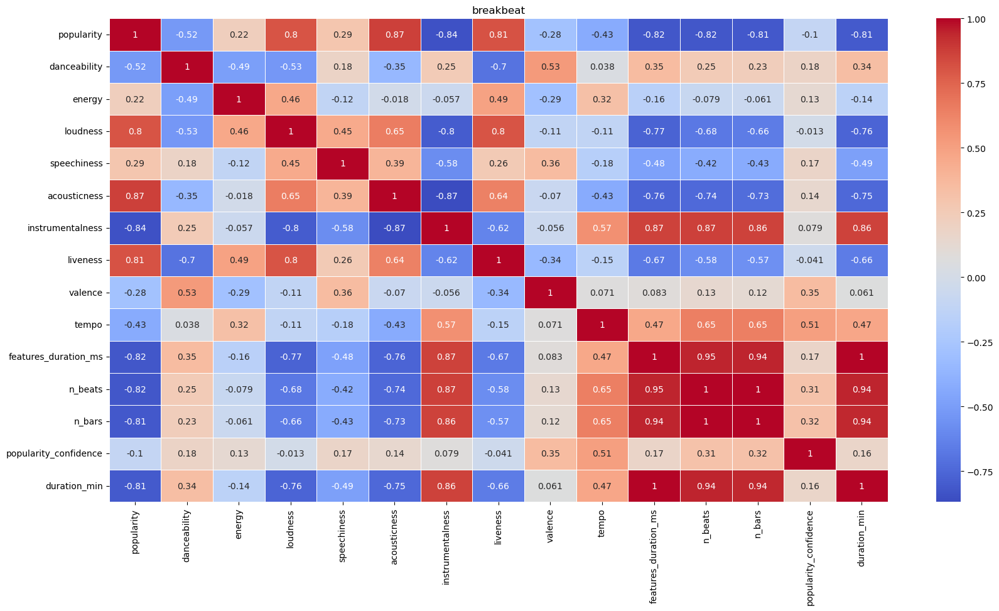

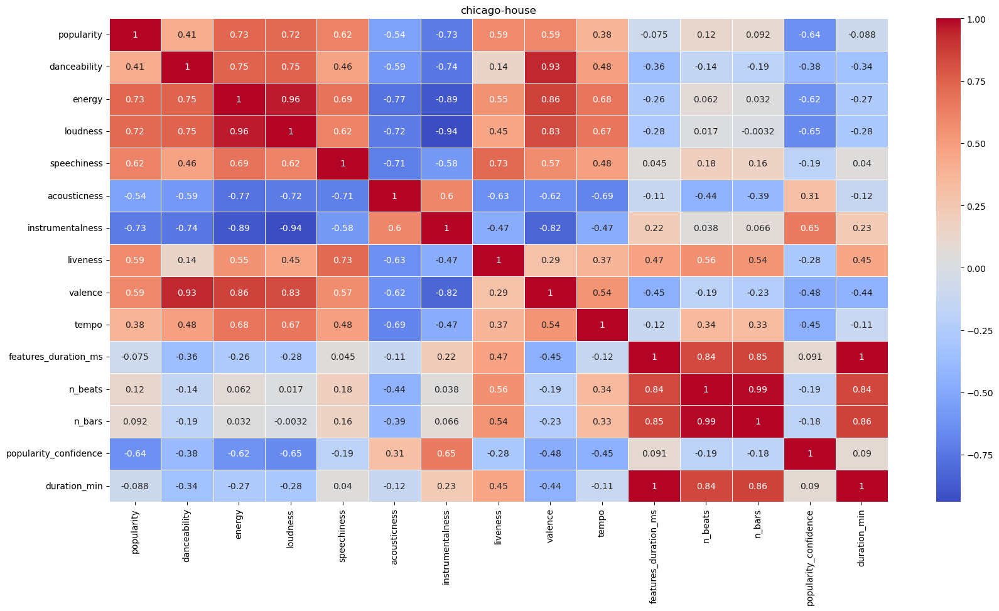

...

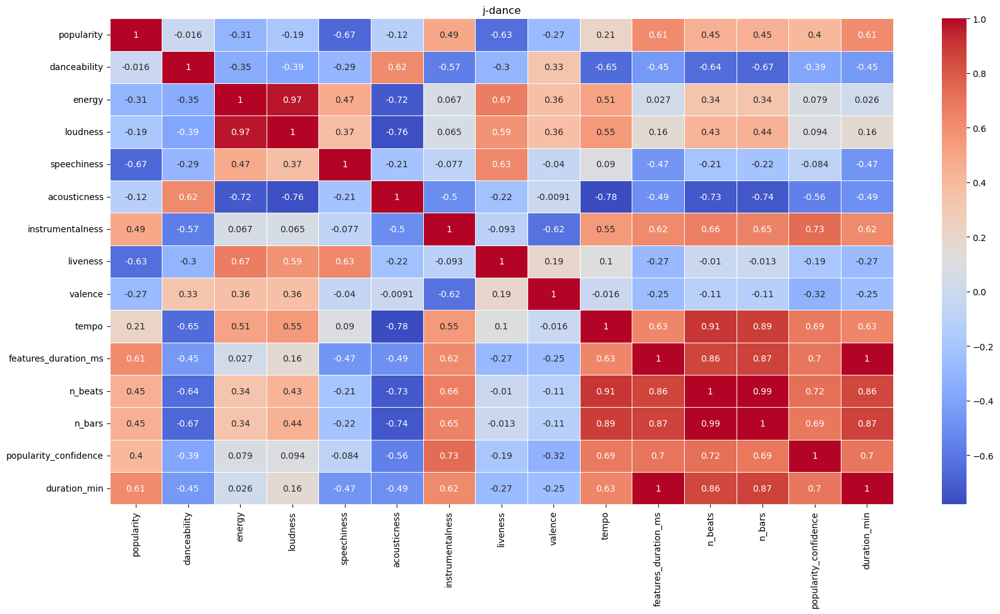

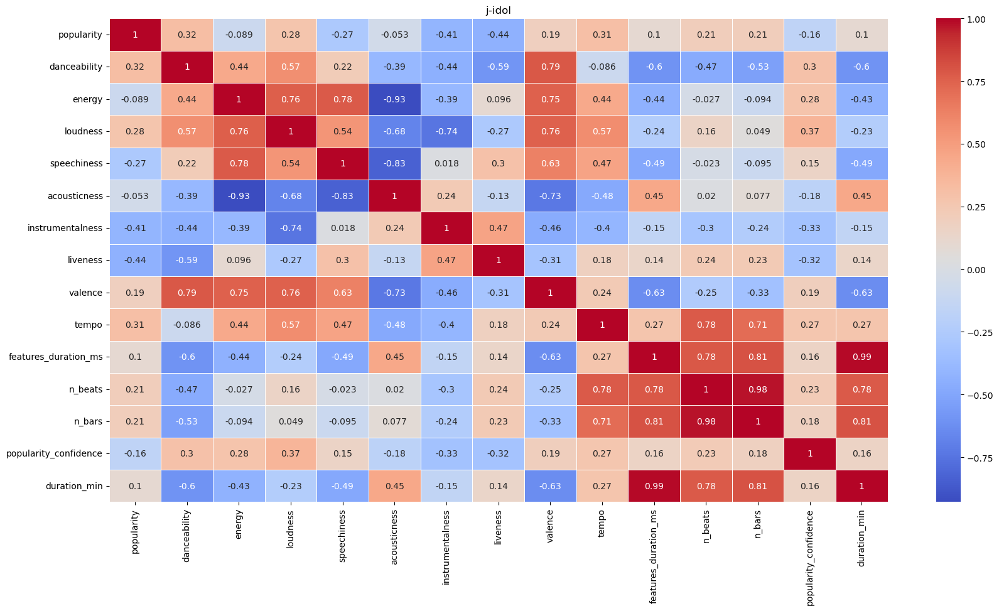

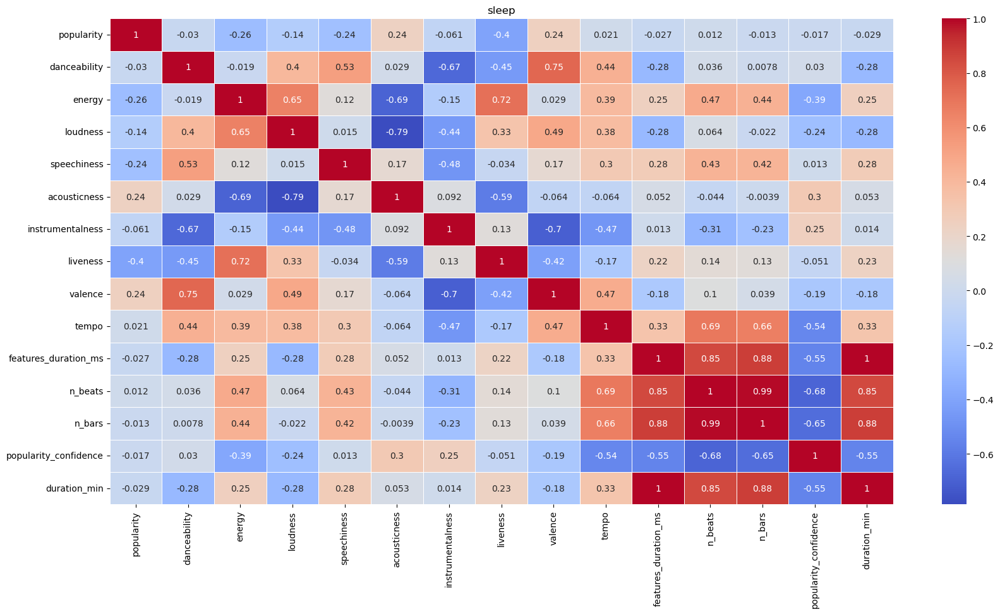

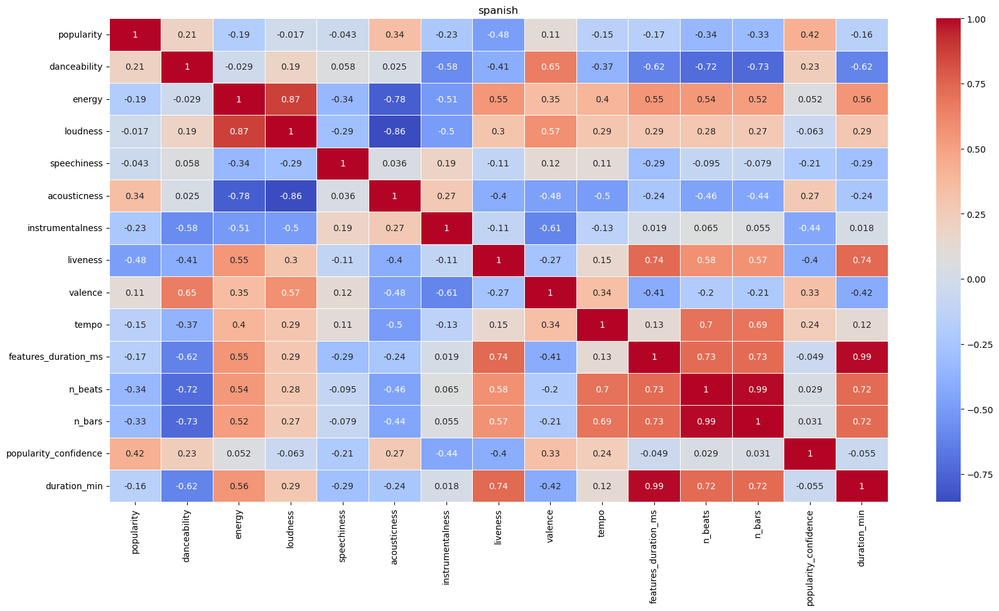

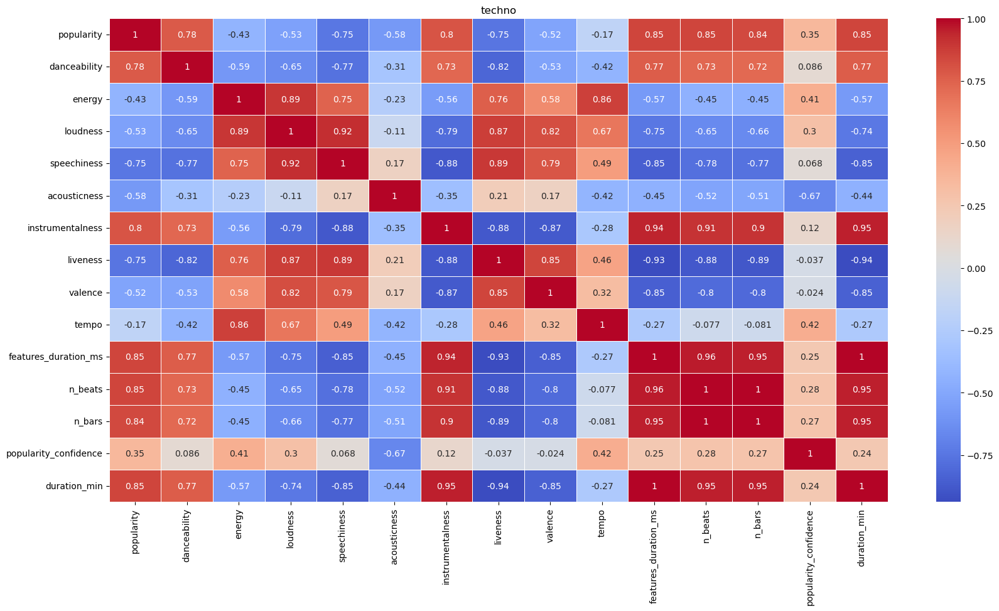

In [27]:
# plotting a heatmap to visualize the correlation matrix
count = 0
for i in range(0,len(genre_correlations),22):
    corr_matrix = genre_correlations.iloc[i:i+21].corr(method = "spearman")
    plt.figure(figsize=(20, 10))  
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
    plt.title(genre_correlations.index[i][0])
    plt.show()
    count += 1

### CATEGORICAL VARIABLES

In [19]:
categorical = df[df.columns[df.nunique() <= 20]]
categorical

,explicit,key,mode,time_signature,processing,genre
0,0,5,1.0,4.0,1.279305,j-dance
1,0,1,0.0,4.0,2.367412,iranian
2,0,2,NaN,4.0,3.700483,black-metal
3,0,5,1.0,4.0,1.279305,bluegrass
4,0,7,1.0,4.0,4.067086,happy
...,...,...,...,...,...,...
14995,0,1,NaN,NaN,2.367412,idm
14996,0,1,1.0,3.0,2.367412,sleep
14997,0,1,NaN,4.0,2.367412,techno
14998,0,5,1.0,4.0,1.279305,breakbeat


In [19]:
len(categorical.columns)

6

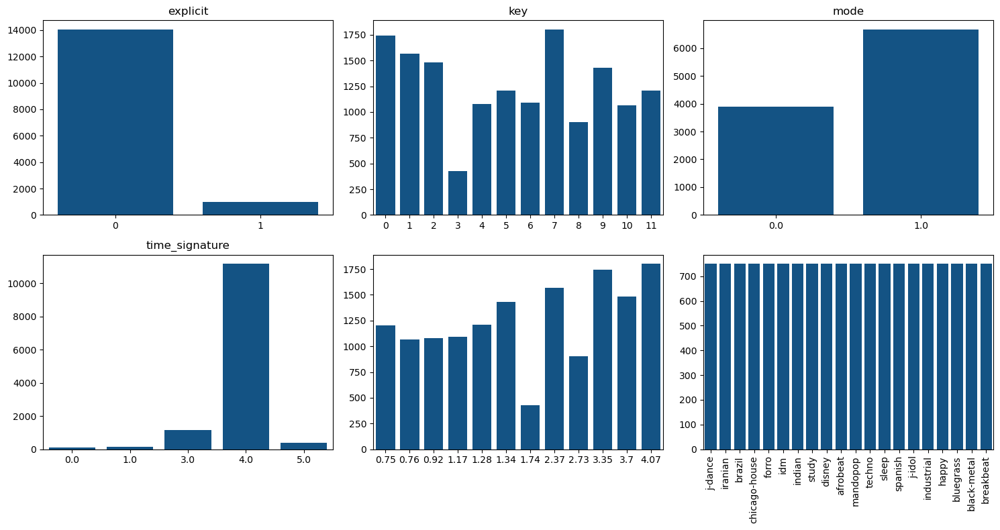

In [166]:
# bar charts for categorical variables
rows = 2
cols = 3 

fig, axs = plt.subplots(rows, cols, figsize=(15, 8)) 

for i, col in enumerate(categorical.columns):
    ax = axs[i // cols, i % cols]
    sns.barplot(x = categorical[col].value_counts().index, y = categorical[col].value_counts().values, ax=ax, color = 'steelblue')
    ax.set_title(col)
    ax.set_xlabel('')
    ax.tick_params(axis='x', rotation=90) 
    
plt.tight_layout()
plt.show()# bar charts for categorical variables
rows = 2
cols = 3 

fig, axs = plt.subplots(rows, cols, figsize=(15, 8)) 

for i, col in enumerate(categorical.columns):
    ax = axs[i // cols, i % cols]
    if col == 'processing':
        sns.barplot(x = categorical[col].round(2).value_counts().index, y = categorical[col].value_counts().values, ax=ax, color = '#015697')
        continue
    if col == 'genre':
        sns.barplot(x = categorical[col].value_counts().index, y = categorical[col].value_counts().values, ax=ax, color = '#015697')
        ax.tick_params(axis='x', rotation=90)
        continue
    sns.barplot(x = categorical[col].value_counts().index, y = categorical[col].value_counts().values, ax=ax, color = '#015697')
    ax.set_title(col)
    ax.set_xlabel('')
    
    
plt.tight_layout()
plt.show()

In [325]:
cmap = clr.LinearSegmentedColormap.from_list('custom_map', ['#f3f8ff', '#015697'], N=256)

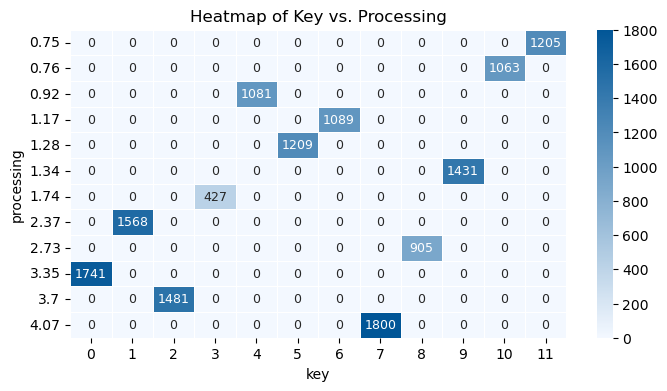

In [331]:
# create a crosstab to compare the relationship between processing and key
cross_tab = pd.crosstab(categorical['processing'].round(2), categorical['key'])
# make heatmap
plt.figure(figsize=(8, 4)) 
ax = sns.heatmap(cross_tab, annot=True, fmt="g", linewidths=.5, annot_kws={"size": 9}, cmap=cmap)  # 'fmt="g"' 关闭科学计数法
ax.set_title('Heatmap of Key vs. Processing')
plt.xticks(rotation=0)  
plt.yticks(rotation=0)
plt.tick_params(axis='both', which='major', labelsize=10)

plt.show()

### FILL NULL

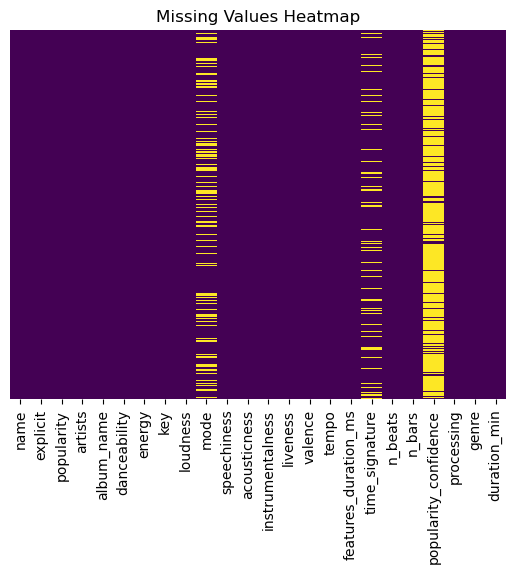

In [28]:
# show the distribution of missing values
sns.heatmap(df.isnull(), cbar=False, yticklabels=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [29]:
df.isnull().sum()

name                         0
explicit                     0
popularity                   0
artists                      0
album_name                   0
danceability                 0
energy                       0
key                          0
loudness                     0
mode                      4450
speechiness                  0
acousticness                 0
instrumentalness             0
liveness                     0
valence                      0
tempo                        0
features_duration_ms         0
time_signature            2062
n_beats                      0
n_bars                       0
popularity_confidence    12783
processing                   0
genre                        0
duration_min                 0
dtype: int64

In [30]:
df['time_signature'].fillna(df['n_beats'].div(df['n_bars']).round(0), inplace = True)

In [54]:
# fill mode
for genre in df['genre'].unique():
    for key in df['key'].unique():
        mode = df[(df['key'] == key) & (df['genre'] == genre)]['mode'].mode()
        df.loc[(df['key'] == key) & (df['genre'] == genre) & (df['mode'].isnull()), 'mode'] = mode[0]

In [106]:
# test accuracy
without_na = df[~df['mode'].isnull()]

for genre in without_na['genre'].unique():
    for key in without_na['key'].unique():
        mode = without_na[(without_na['key'] == key) & (without_na['genre'] == genre)]['mode'].mode()
        without_na.loc[(without_na['key'] == key) & (without_na['genre'] == genre), 'mode'] = mode[0]   
        
(df[~df['mode'].isnull()]['mode'] == without_na['mode']).sum()/10550

0.6960189573459715

In [40]:
df.isnull().sum()

name                         0
duration_min                 0
explicit                     0
popularity                   0
artists                      0
album_name                   0
danceability                 0
energy                       0
key                          0
loudness                     0
mode                         0
speechiness                  0
acousticness                 0
instrumentalness             0
liveness                     0
valence                      0
tempo                        0
features_duration_ms         0
time_signature               0
n_beats                      0
n_bars                       0
popularity_confidence    12783
processing                   0
genre                        0
dtype: int64

### NORMALIZATION

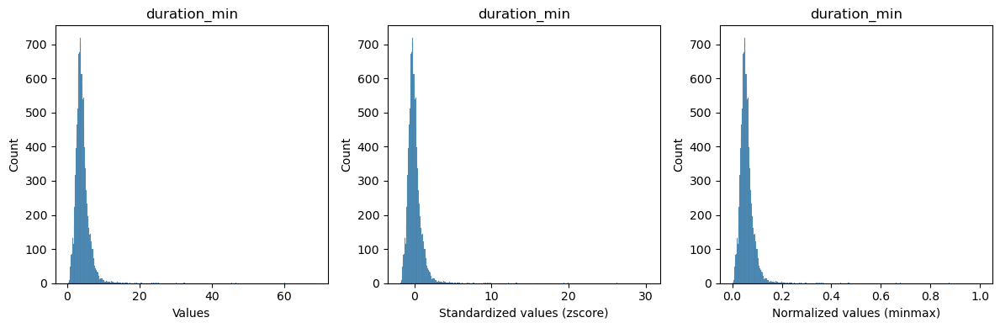

In [32]:
X = df[['duration_min','loudness']]
# initialize and apply standard scaling
scaler = StandardScaler()
# compute mean and std of the data
scaler.fit(X)
# initialize and apply min-max scaling
X_scal = scaler.transform(X)
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

i = 0 # column index
fig, axs = plt.subplots(1,3, figsize=(12, 4)) # 1 row, 3 columns

sns.histplot(X.iloc[:,i], ax=axs[0]).set(title='duration_min')
axs[0].set(xlabel='Values')

sns.histplot(X_scal[:,i], ax=axs[1]).set(title='duration_min')
axs[1].set(xlabel='Standardized values (zscore)')

sns.histplot(X_minmax[:,i], ax=axs[2]).set(title='duration_min')
axs[2].set(xlabel='Normalized values (minmax)')

plt.tight_layout() # Adjust the padding between and around subplots

In [8]:
df.columns

Index(['name', 'explicit', 'popularity', 'artists', 'album_name',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'features_duration_ms', 'time_signature', 'n_beats', 'n_bars',
       'popularity_confidence', 'processing', 'genre', 'duration_min'],
      dtype='object')

In [9]:
# drop certain columns to create a clean DataFrame
df_cl = df.drop(columns=['name','explicit', 'artists',
                         'album_name','key', 'mode', 
                         'features_duration_ms', 'time_signature', 
                         'popularity_confidence', 'processing', 'genre'])

In [10]:
df_cl.head()

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,n_beats,n_bars,duration_min
0,46,0.690,0.513,-12.529,0.0975,0.302000,0.53600,0.281,0.6350,142.221,567.0,141.0,4.029333
1,0,0.069,0.196,-24.801,0.0805,0.283000,0.93400,0.360,0.0336,75.596,617.0,155.0,7.400000
2,3,0.363,0.854,-7.445,0.0397,0.000089,0.80000,0.262,0.4890,116.628,652.0,162.0,5.558433
3,23,0.523,0.585,-5.607,0.0765,0.066400,0.00127,0.117,0.3850,140.880,619.0,155.0,4.496667
4,25,0.643,0.687,-11.340,0.0539,0.000576,0.09690,0.299,0.6370,143.956,733.0,183.0,5.127517


In [11]:
# define columns to analyze
cols = ['duration_min','popularity','loudness', 'tempo', 'n_beats', 'n_bars']
X = df_cl[cols]
scaler = MinMaxScaler()
# apply the scaler and transform the data
X_minmax = scaler.fit_transform(X)

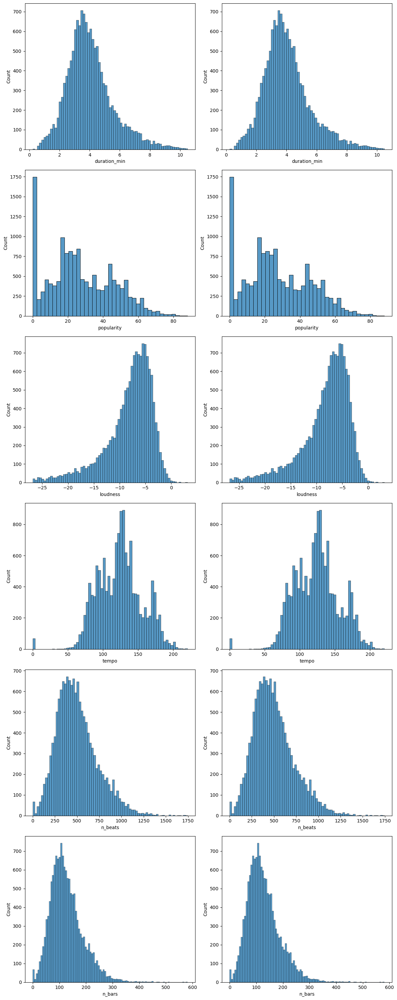

In [40]:
fig, axs = plt.subplots(len(cols), 2, figsize=(12, 30))

# iterate over columns and plot histograms of original data in the first column of subplots
for i, col in enumerate(cols):
    ax = axs[i, 0]  
    sns.histplot(df_cl[col], ax=ax)
    ax.set_xlabel(col)

# iterate over columns and plot histograms of the corresponding column from the new DataFrame in the second column of subplots   
for i, col in enumerate(cols):
    ax = axs[i, 1]  
    sns.histplot(df_new[col], ax=ax)
    ax.set_xlabel(col) 

plt.tight_layout()
plt.show()

In [12]:
df_cl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   popularity        15000 non-null  int64  
 1   danceability      15000 non-null  float64
 2   energy            15000 non-null  float64
 3   loudness          15000 non-null  float64
 4   speechiness       15000 non-null  float64
 5   acousticness      15000 non-null  float64
 6   instrumentalness  15000 non-null  float64
 7   liveness          15000 non-null  float64
 8   valence           15000 non-null  float64
 9   tempo             15000 non-null  float64
 10  n_beats           15000 non-null  float64
 11  n_bars            15000 non-null  float64
 12  duration_min      15000 non-null  float64
dtypes: float64(12), int64(1)
memory usage: 1.5 MB


In [13]:
df_cl.to_csv('df_4_clustering.csv', index=False) 

### output high_corr data pairs

In [82]:
# calculate the correlation for each genre
grouped_corr = numeric_data.groupby(df['genre']).apply(lambda group: group.corr())

def extract_high_corr(data_corr, threshold=0.7):
    # only use the upper triangle of the matrix to avoid counting duplicates
    high_corr = data_corr.where(np.triu(np.ones(data_corr.shape), k=1).astype(bool))
    high_corr = high_corr.stack().reset_index()
    # make sure the column names match the data
    high_corr.columns = ['Level', 'Var1', 'Var2', 'Correlation']
    # check if the absolute value of correlation is above the threshold
    return high_corr[np.abs(high_corr['Correlation']) >= threshold]

# apply the function to extract high correlations for each genre
high_corr_by_genre = grouped_corr.groupby(level=0).apply(extract_high_corr)

# exclude time-related columns
time_related_vars = ["features_duration_ms", "n_beats", "n_bars", "duration_min"]
filtered_corr_by_genre = high_corr_by_genre[~(
    high_corr_by_genre['Var1'].isin(time_related_vars) | high_corr_by_genre['Var2'].isin(time_related_vars)
)]

# print high correlation pairs for each genre
for genre, data in filtered_corr_by_genre.groupby(level=0):
    print(f"Genre: {genre}")
    print(data[['Var1', 'Var2', 'Correlation']])

Genre: bluegrass
                Var1      Var2  Correlation
genre                                      
bluegrass 27  energy  loudness     0.712357
Genre: disney
             Var1          Var2  Correlation
genre                                       
disney 27  energy      loudness     0.822722
       29  energy  acousticness    -0.767602
Genre: idm
            Var1      Var2  Correlation
genre                                  
idm   27  energy  loudness     0.812306
Genre: indian
             Var1      Var2  Correlation
genre                                   
indian 27  energy  loudness      0.76984
Genre: iranian
                Var1          Var2  Correlation
genre                                          
iranian 27    energy      loudness     0.862749
        29    energy  acousticness    -0.755787
        40  loudness  acousticness    -0.706804
Genre: j-dance
              Var1      Var2  Correlation
genre                                    
j-dance 27  energy  loudness     0.